In [1]:
%cd ../

/home/zulqarnain/develop/htfatorch


In [2]:
import logging
import numpy as np
import htfa_torch.htfa as HTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/zulqarnain/anaconda3/envs/htfatorch/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)
/home/zulqarnain/anaconda3/envs/htfatorch/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)
/home/zulqarnain/anaconda3/envs/htfatorch/lib/python3.7/site-packages/sklearn/utils/deprecation.py

In [3]:
from scipy.spatial import distance
from scipy import stats
import nilearn.plotting as niplot
import statsmodels.stats.multitest as smt

In [4]:
%matplotlib inline

In [5]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [6]:
haxby_db = niidb.FMriActivationsDb('data/haxby_mc_zrest.db')

In [7]:
htfa = HTFA.HierarchicalTopographicFactorAnalysis([b for b in haxby_db.all() if 'rest' not in b.task], mask='/home/eli/Documents/Haxby_Final/mask/haxby_mask.nii.gz', num_factors=100)

05/31/2020 12:55:06 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run01_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 12:55:07 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run02_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 12:55:07 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run03_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 12:55:08 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run04_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 12:55:09 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub1_run0

05/31/2020 12:55:33 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run02_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 12:55:33 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run03_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 12:55:34 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run04_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 12:55:35 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run05_mc_MNI_masked.nii.gz with mask /home/zulqarnain/fmri_data/Haxby_Final/mask/haxby_mask.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
05/31/2020 12:55:36 Loading Nifti image /home/zulqarnain/fmri_data/Haxby_Final/sub4_run0

In [8]:
htfa.num_parameters()

1436000

In [9]:
htfa.load_state('data/haxby_norest_trainval_k100_n2000_05312020_125029')

In [10]:
def task_labeler(b):
    return b.task

def rest_task_labeler(b):
    if b.task == 'rest':
        return 'Rest'
    else:
        return 'Task'

In [11]:
def subject_labeler(block):
    return 'Subject %d' % block.subject

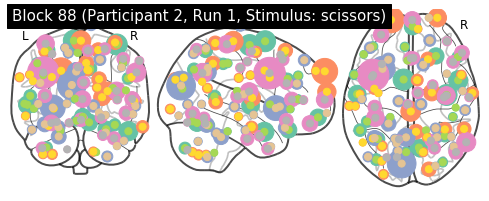

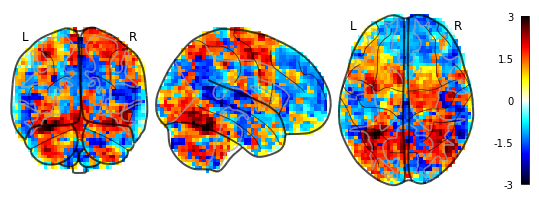

05/31/2020 12:56:14 Reconstruction Error (Frobenius Norm): 5.52674072e+02 out of 6.36484863e+02


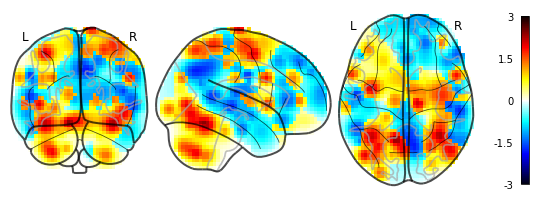

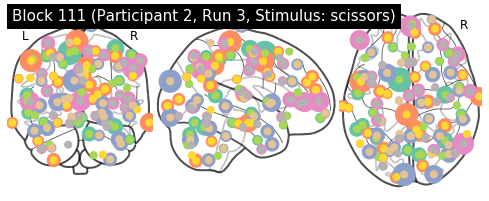

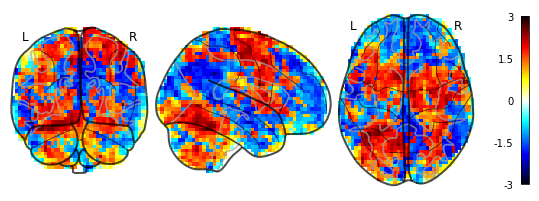

05/31/2020 12:56:17 Reconstruction Error (Frobenius Norm): 5.37067383e+02 out of 6.30872864e+02


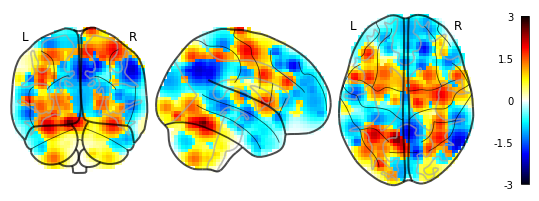

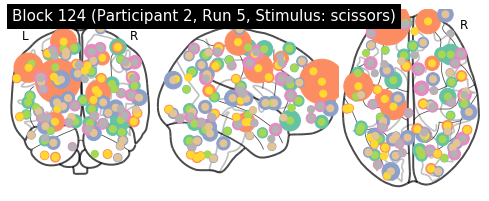

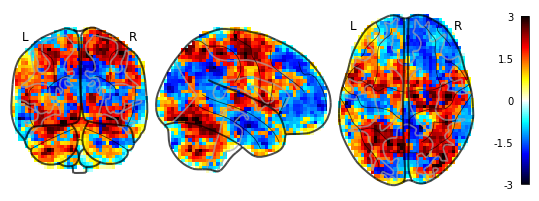

05/31/2020 12:56:19 Reconstruction Error (Frobenius Norm): 5.53135620e+02 out of 6.44300903e+02


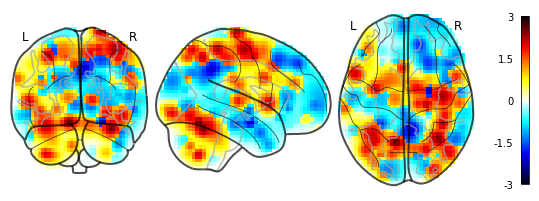

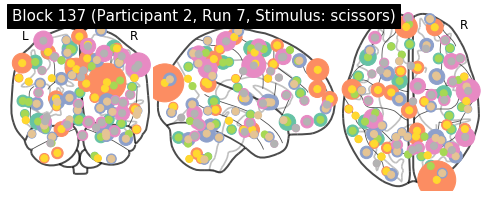

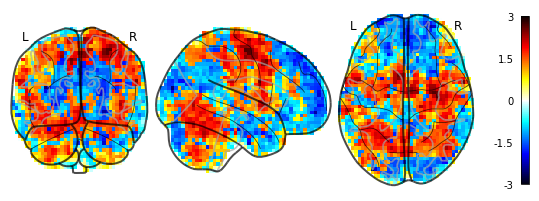

05/31/2020 12:56:22 Reconstruction Error (Frobenius Norm): 5.30792603e+02 out of 6.00198181e+02


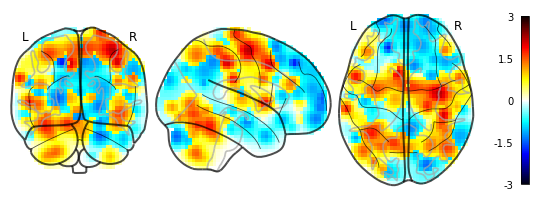

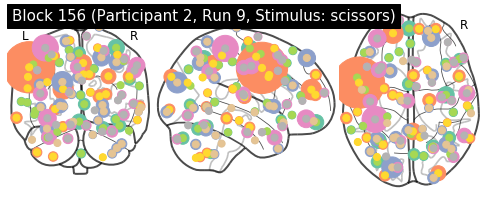

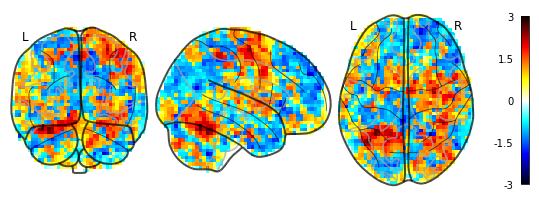

05/31/2020 12:56:25 Reconstruction Error (Frobenius Norm): 5.36020996e+02 out of 5.76843079e+02


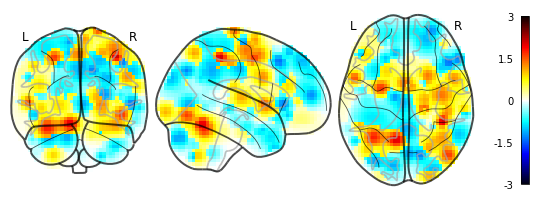

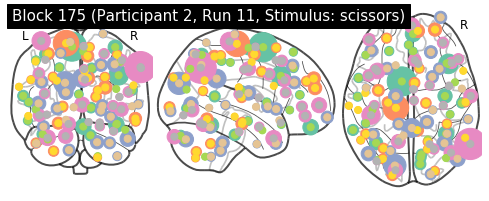

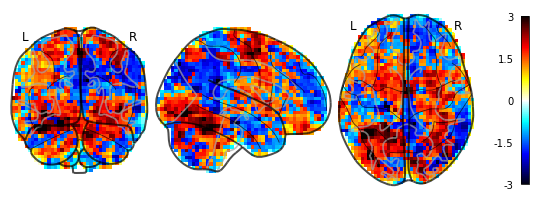

05/31/2020 12:56:28 Reconstruction Error (Frobenius Norm): 5.44521973e+02 out of 6.35086487e+02


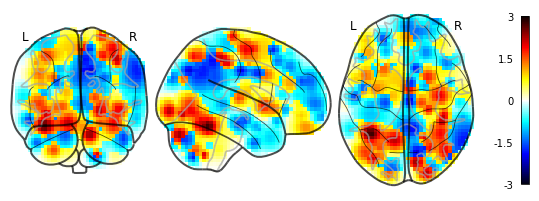

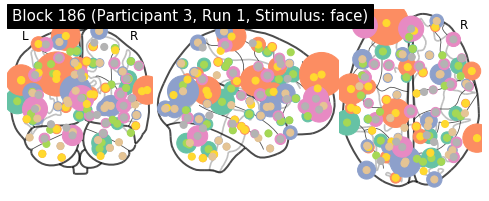

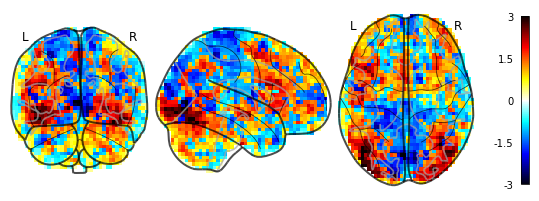

05/31/2020 12:56:30 Reconstruction Error (Frobenius Norm): 5.53262756e+02 out of 6.09614807e+02


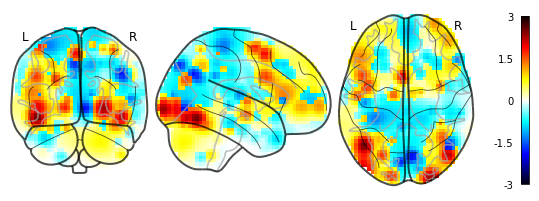

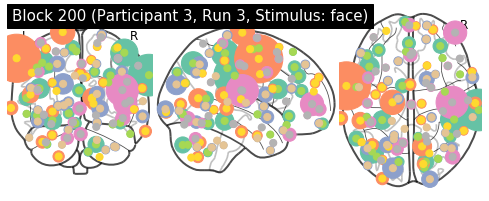

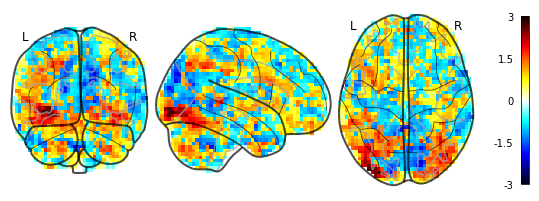

05/31/2020 12:56:33 Reconstruction Error (Frobenius Norm): 5.21136108e+02 out of 5.52729492e+02


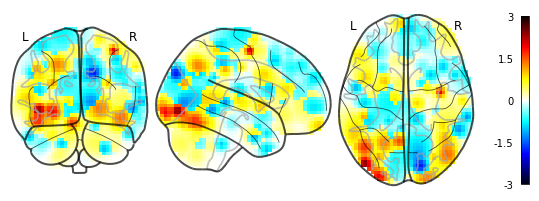

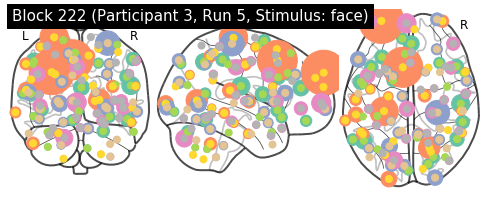

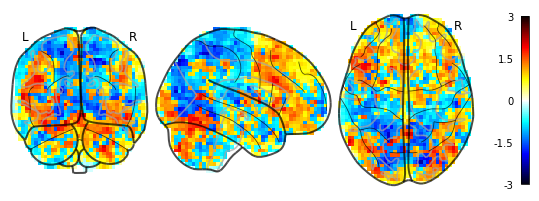

05/31/2020 12:56:36 Reconstruction Error (Frobenius Norm): 5.11515961e+02 out of 5.51140503e+02


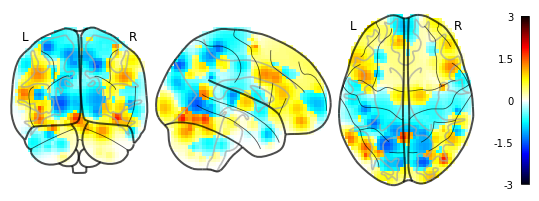

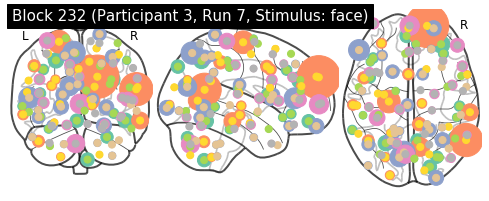

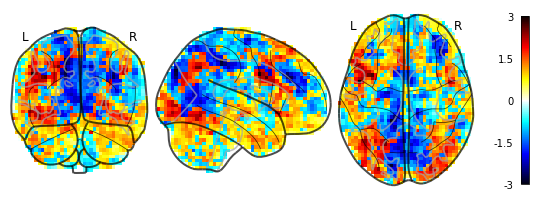

05/31/2020 12:56:39 Reconstruction Error (Frobenius Norm): 5.06379974e+02 out of 5.51951294e+02


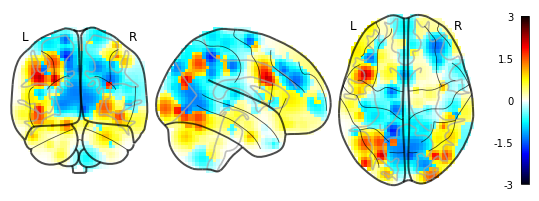

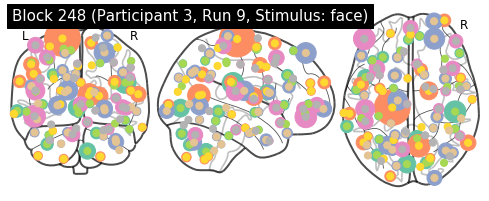

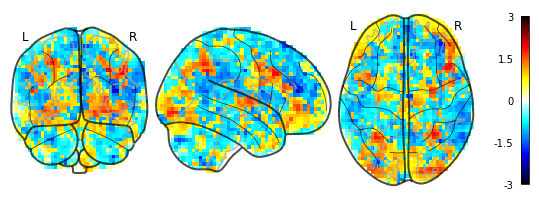

05/31/2020 12:56:41 Reconstruction Error (Frobenius Norm): 4.80923859e+02 out of 5.08276062e+02


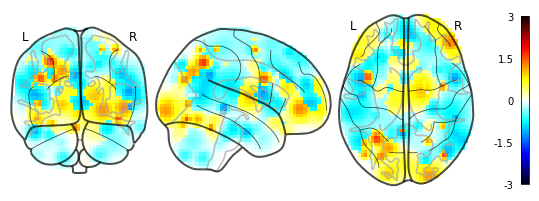

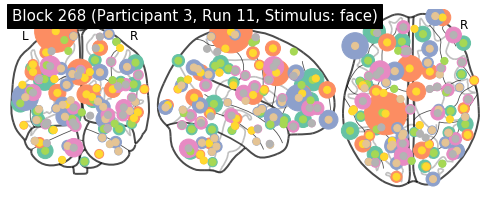

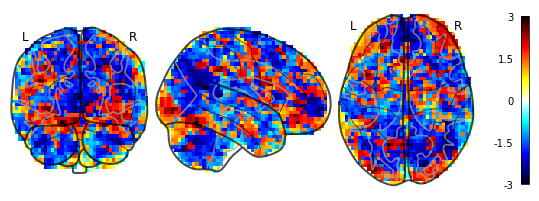

05/31/2020 12:56:44 Reconstruction Error (Frobenius Norm): 5.80002686e+02 out of 6.55966431e+02


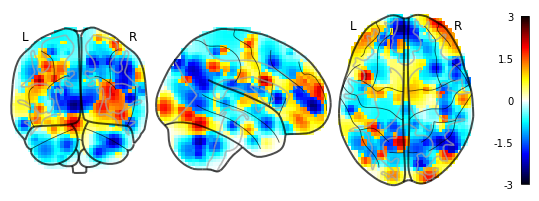

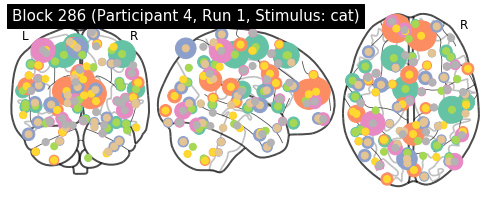

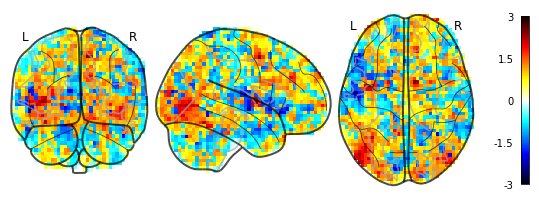

05/31/2020 12:56:47 Reconstruction Error (Frobenius Norm): 5.09061798e+02 out of 5.31463013e+02


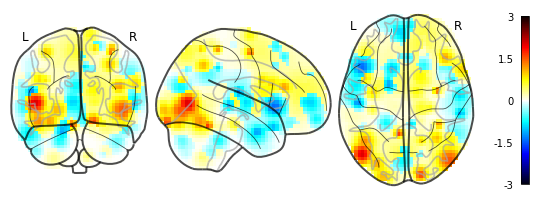

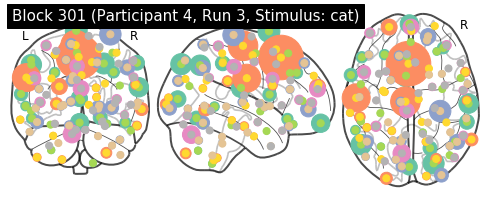

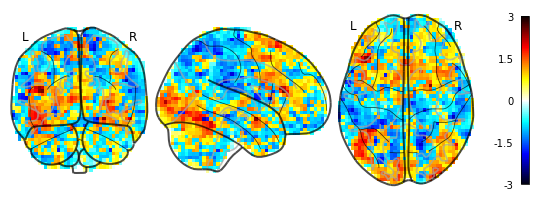

05/31/2020 12:56:49 Reconstruction Error (Frobenius Norm): 4.74945618e+02 out of 5.00539276e+02


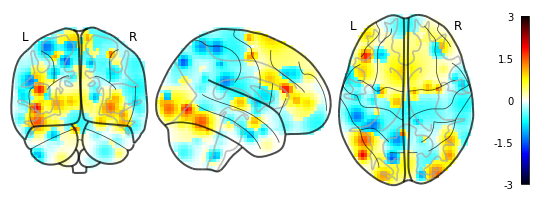

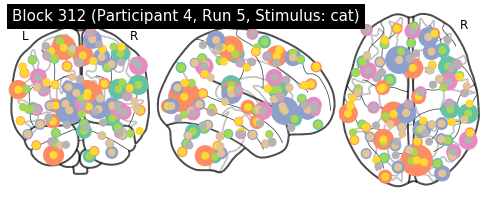

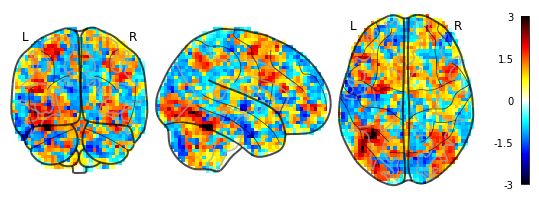

05/31/2020 12:56:52 Reconstruction Error (Frobenius Norm): 5.42519714e+02 out of 5.75106262e+02


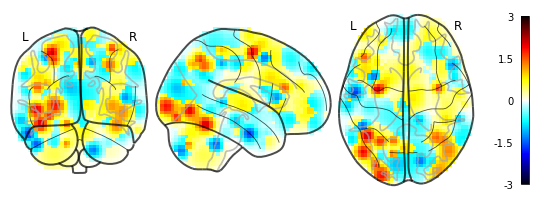

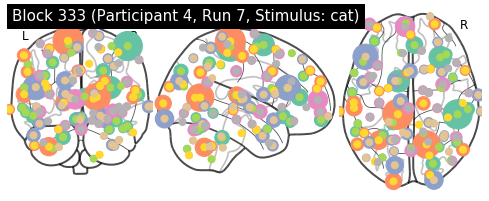

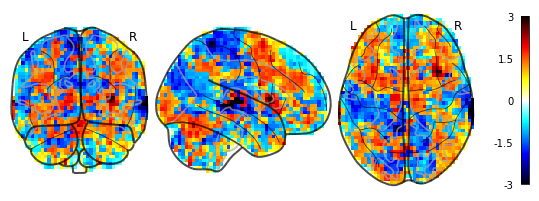

05/31/2020 12:56:55 Reconstruction Error (Frobenius Norm): 5.47900940e+02 out of 5.95553711e+02


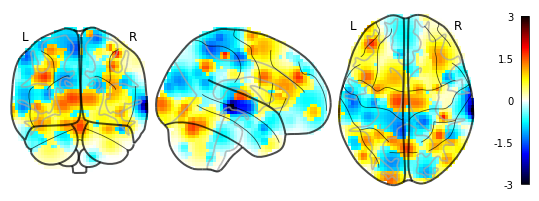

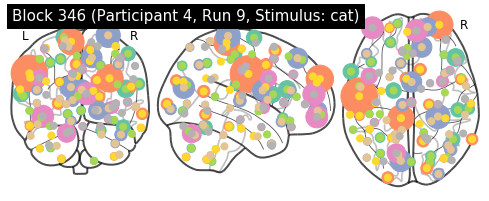

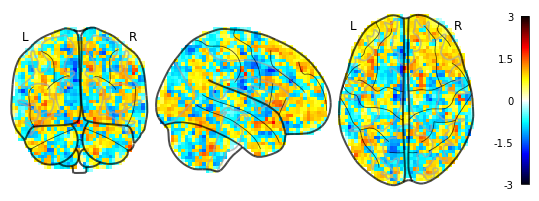

05/31/2020 12:56:58 Reconstruction Error (Frobenius Norm): 4.71370148e+02 out of 4.82947083e+02


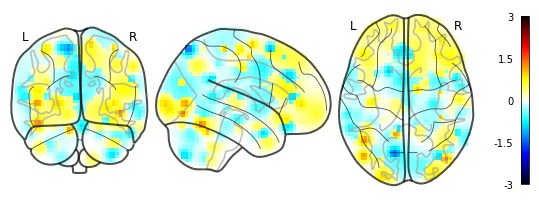

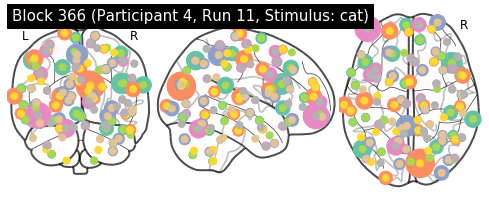

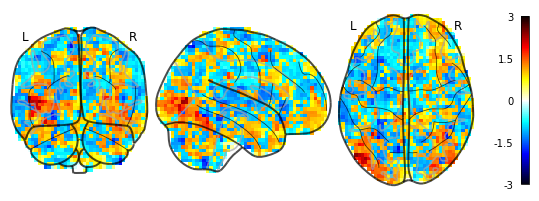

05/31/2020 12:57:00 Reconstruction Error (Frobenius Norm): 5.00834167e+02 out of 5.20422485e+02


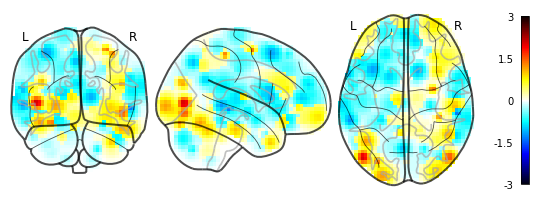

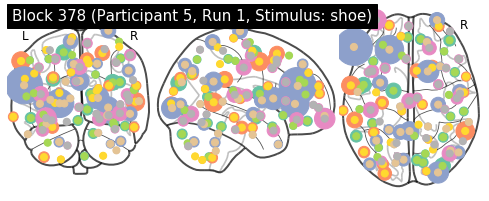

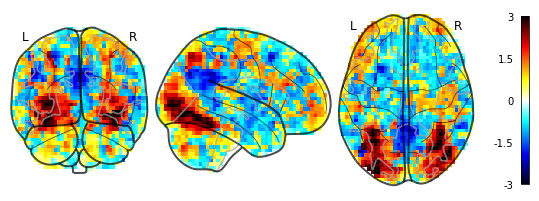

05/31/2020 12:57:03 Reconstruction Error (Frobenius Norm): 5.30867676e+02 out of 5.86504456e+02


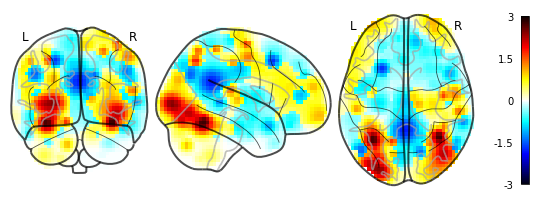

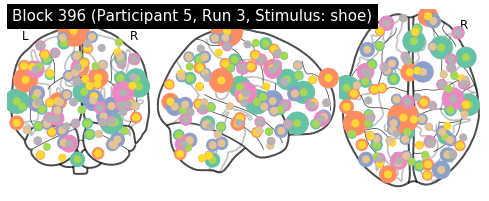

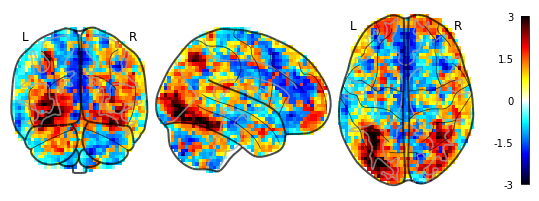

05/31/2020 12:57:06 Reconstruction Error (Frobenius Norm): 5.60588867e+02 out of 6.15271301e+02


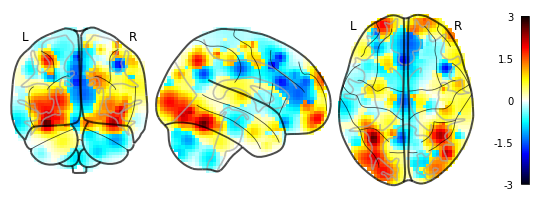

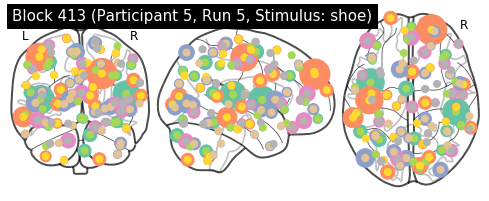

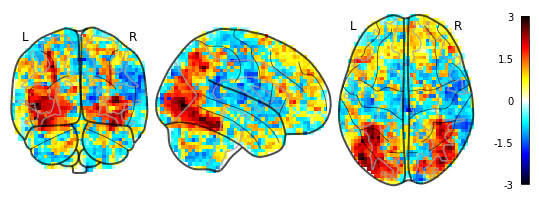

05/31/2020 12:57:09 Reconstruction Error (Frobenius Norm): 5.35751465e+02 out of 5.70584167e+02


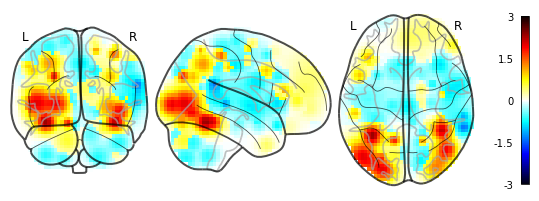

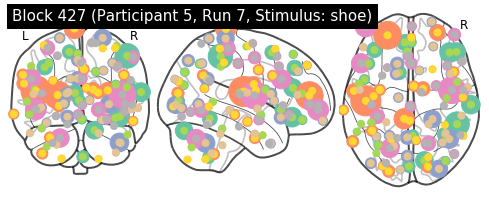

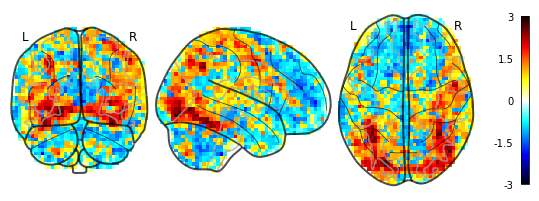

05/31/2020 12:57:11 Reconstruction Error (Frobenius Norm): 5.40776306e+02 out of 5.70172791e+02


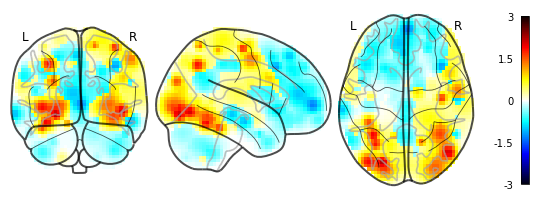

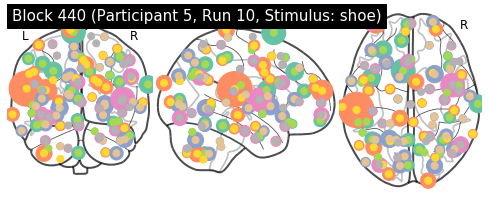

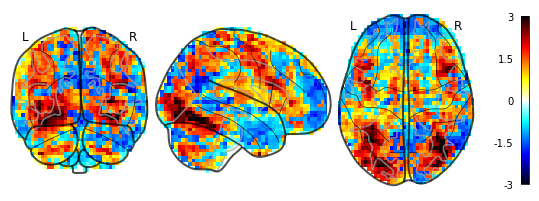

05/31/2020 12:57:14 Reconstruction Error (Frobenius Norm): 5.55756226e+02 out of 6.12698792e+02


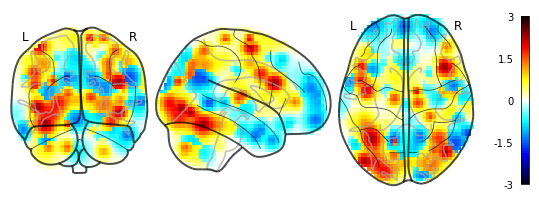

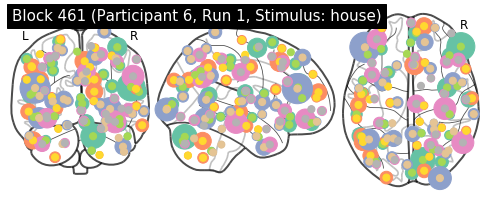

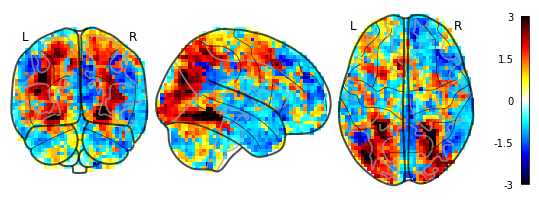

05/31/2020 12:57:17 Reconstruction Error (Frobenius Norm): 5.32172974e+02 out of 6.04306580e+02


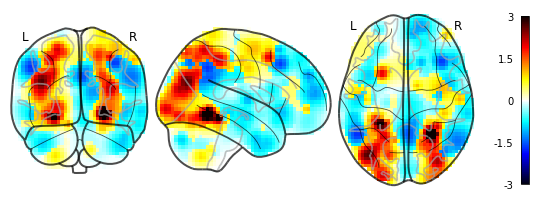

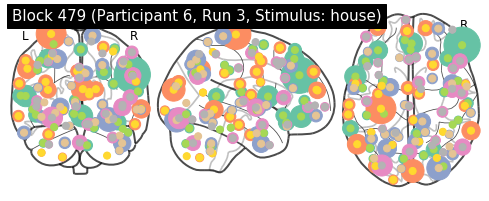

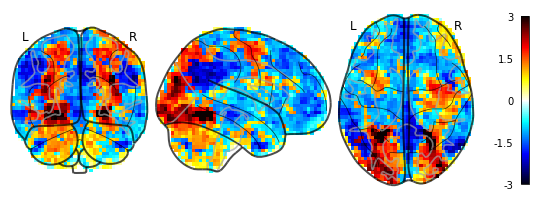

05/31/2020 12:57:20 Reconstruction Error (Frobenius Norm): 5.34251648e+02 out of 6.05236023e+02


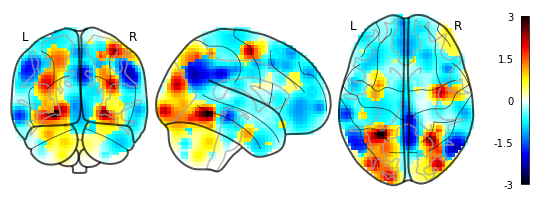

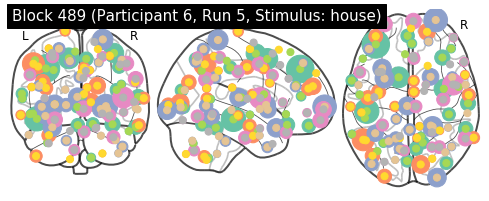

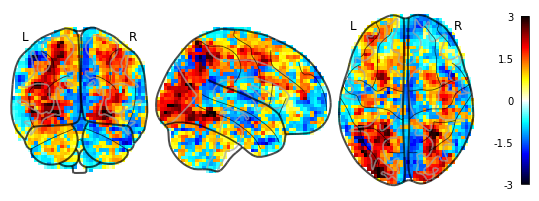

05/31/2020 12:57:22 Reconstruction Error (Frobenius Norm): 5.29349182e+02 out of 5.82021851e+02


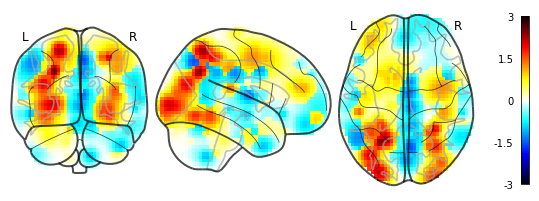

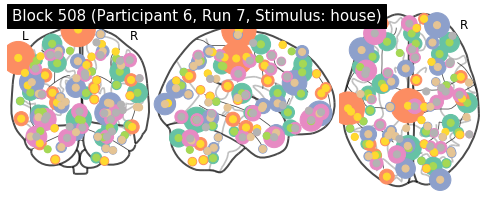

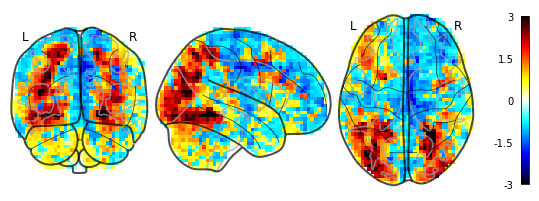

05/31/2020 12:57:25 Reconstruction Error (Frobenius Norm): 5.30982544e+02 out of 5.83054688e+02


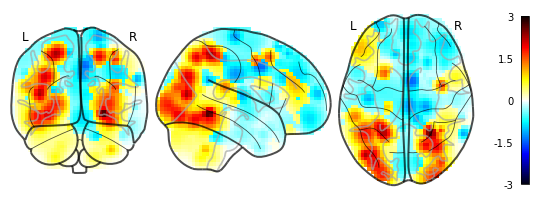

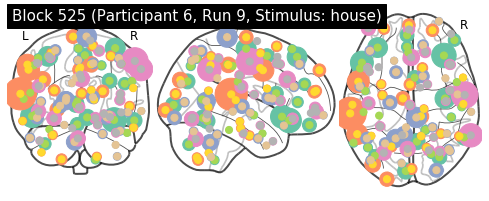

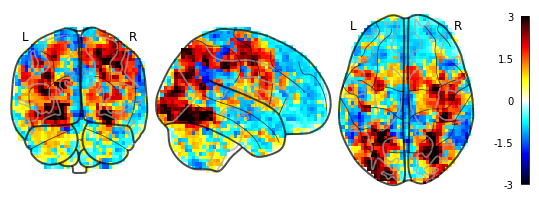

05/31/2020 12:57:28 Reconstruction Error (Frobenius Norm): 5.30327148e+02 out of 5.96572083e+02


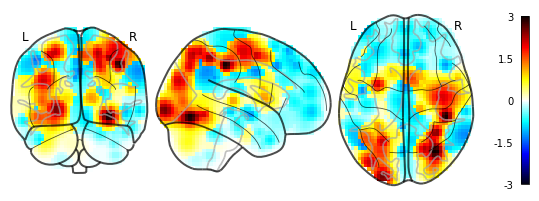

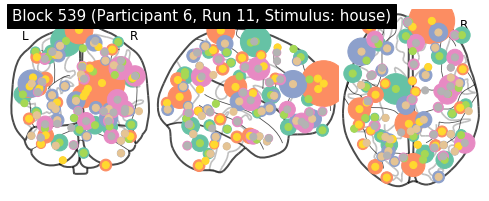

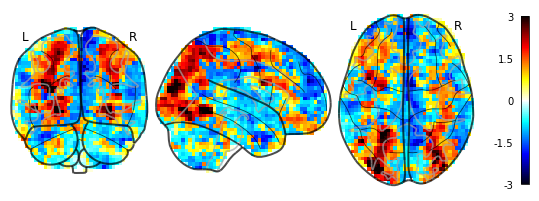

05/31/2020 12:57:31 Reconstruction Error (Frobenius Norm): 5.50387878e+02 out of 5.97426270e+02


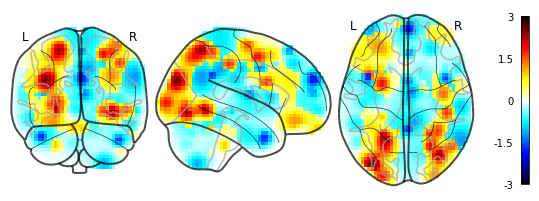

In [12]:
validation_filter = haxby_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(htfa._blocks) if validation_filter(block)]

for index in validation_blocks[0:-1:2]:
    htfa.plot_factor_centers(index)
    htfa.plot_original_brain(index, labeler=lambda b: None, t=None)
    htfa.plot_reconstruction(index, labeler=lambda b: None, t=None)

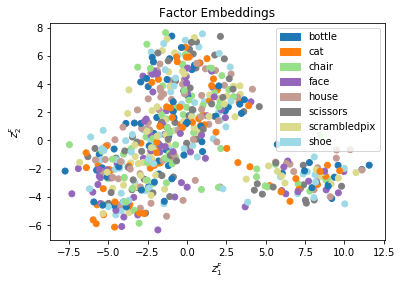

In [13]:
#factor 'embeddings' with PCA
htfa.scatter_factor_embedding(labeler=task_labeler,embedding='PCA')

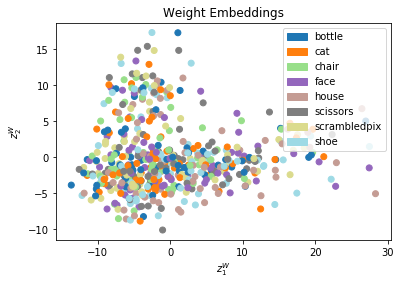

In [14]:
#weight 'embeddings' with PCA
htfa.scatter_weight_embedding(labeler=task_labeler,embedding='PCA')

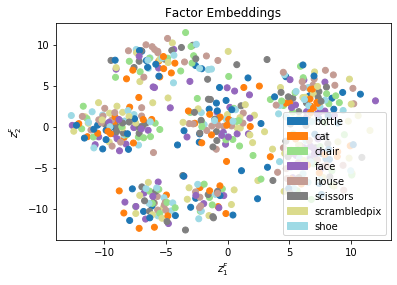

In [15]:
#factor 'embeddings' with TSNE
htfa.scatter_factor_embedding(labeler=task_labeler,embedding='TSNE')

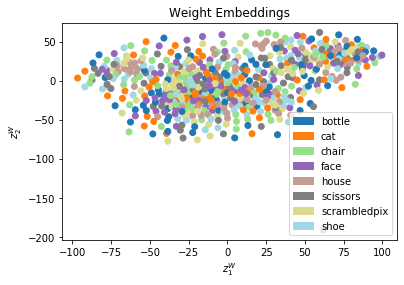

In [16]:
#weight 'embeddings' with TSNE
htfa.scatter_weight_embedding(labeler=task_labeler,embedding='TSNE')

In [17]:
htfa.average_reconstruction_error(weighted=False, blocks_filter=haxby_db.inference_filter(training=True))

05/31/2020 12:57:44 Average reconstruction error (MSE): 4.95103868e+02 +/- 3.65154160e+01
05/31/2020 12:57:44 Average data norm (Euclidean): 6.03396824e+02 +/- 6.17218757e+01
05/31/2020 12:57:44 Percent average reconstruction error: 82.336768 +/- 3.60726525e+00


(array([536.91363525, 522.26177979, 487.70074463, 492.08016968,
        506.69363403, 494.21792603, 499.35122681, 472.46600342,
        536.6116333 , 513.95770264, 485.60287476, 438.91403198,
        459.53143311, 474.32138062, 534.4777832 , 520.61102295,
        490.14367676, 486.55706787, 462.91964722, 490.64978027,
        470.1194458 , 515.54119873, 485.13265991, 493.14007568,
        590.43334961, 535.01538086, 488.65710449, 517.46331787,
        465.30679321, 501.14196777, 501.45883179, 463.74282837,
        561.96124268, 507.30273438, 455.91390991, 480.38555908,
        512.6015625 , 481.8894043 , 495.55154419, 525.89086914,
        570.36993408, 493.14749146, 488.54800415, 511.70809937,
        515.20410156, 499.23236084, 533.38824463, 480.92892456,
        510.38885498, 524.28515625, 472.43377686, 449.2272644 ,
        495.23449707, 532.89349365, 500.32803345, 529.28155518,
        445.14044189, 442.57162476, 457.36224365, 439.29272461,
        454.5897522 , 462.0874939 , 422.

In [18]:
htfa.average_reconstruction_error(weighted=False, blocks_filter=haxby_db.inference_filter(training=False))

05/31/2020 12:57:46 Average reconstruction error (MSE): 4.99285619e+02 +/- 3.20076743e+01
05/31/2020 12:57:46 Average data norm (Euclidean): 5.96211314e+02 +/- 5.55892500e+01
05/31/2020 12:57:46 Percent average reconstruction error: 83.999361 +/- 3.35425352e+00


(array([501.94702148, 502.52789307, 504.0177002 , 578.71472168,
        518.90533447, 502.98049927, 493.82507324, 584.5479126 ,
        496.99102783, 485.62628174, 517.77124023, 524.49713135,
        518.09661865, 546.55554199, 480.42453003, 482.59365845,
        475.23458862, 491.62319946, 479.60327148, 495.74700928,
        436.64569092, 539.74505615, 549.63092041, 492.53793335,
        460.71228027, 456.38998413, 444.42581177, 479.36032104,
        502.74118042, 498.15863037, 511.00466919, 464.3263855 ,
        437.04907227, 468.04962158, 463.94961548, 451.20913696,
        488.21142578, 523.6161499 , 516.92327881, 578.35986328,
        496.11358643, 514.85534668, 491.06472778, 479.28393555,
        507.35595703, 496.7024231 , 489.78573608, 484.38137817,
        493.21954346, 481.30419922, 486.65365601, 544.46673584,
        472.6880188 , 520.98852539, 480.40267944, 529.07110596,
        501.91088867, 543.04016113]),
 array([636.48486328, 642.44055176, 630.87286377, 780.36627197,
  

In [19]:
htfa.free_energy(batch_size=15, use_cuda=True, blocks_batch_size=8, blocks_filter=haxby_db.inference_filter(training=True))

[[5973905408.0, -5962145792.0, 11759558.0],
 [5974777856.0, -5960755712.0, 11797822.0]]

In [20]:
htfa.free_energy(batch_size=15, use_cuda=True, blocks_batch_size=8, blocks_filter=haxby_db.inference_filter(training=False))

[[718539392.0, -717266560.0, 1272797.75],
 [719449728.0, -716574400.0, 1284074.5]]